In [1]:
import pandas as pd 
import datetime , calendar
import folium
import matplotlib

Importing Data Set 

In [2]:
data=pd.read_csv("dataset (1).csv")

In [3]:
data.head

<bound method NDFrame.head of                   TRIP_ID CALL_TYPE   TIMESTAMP  \
0     1372636858620000589         C  1372636858   
1     1372637303620000596         B  1372637303   
2     1372636951620000320         C  1372636951   
3     1372636854620000520         C  1372636854   
4     1372637091620000337         C  1372637091   
...                   ...       ...         ...   
9995  1372840956620000118         C  1372840956   
9996  1372841563620000304         C  1372841563   
9997  1372836480620000341         C  1372836480   
9998  1372838570620000387         C  1372838570   
9999  1372837696620000279         A  1372837696   

                                              TRIP_PATH  
0     [(41.141412, -8.618643), (41.141376, -8.618499...  
1     [(41.159826, -8.639847), (41.159871, -8.640351...  
2     [(41.140359, -8.612964), (41.14035, -8.613378)...  
3     [(41.151951, -8.574678), (41.151942, -8.574705...  
4     [(41.18049, -8.645994), (41.180517, -8.645949)...  
...      

In [4]:
data.TRIP_PATH=data.TRIP_PATH.apply(eval)
data.head()

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH
0,1372636858620000589,C,1372636858,"[(41.141412, -8.618643), (41.141376, -8.618499..."
1,1372637303620000596,B,1372637303,"[(41.159826, -8.639847), (41.159871, -8.640351..."
2,1372636951620000320,C,1372636951,"[(41.140359, -8.612964), (41.14035, -8.613378)..."
3,1372636854620000520,C,1372636854,"[(41.151951, -8.574678), (41.151942, -8.574705..."
4,1372637091620000337,C,1372637091,"[(41.18049, -8.645994), (41.180517, -8.645949)..."


In [5]:
extract_starting_point= lambda list_:list_[0]
extract_ending_point= lambda list_:list_[-1]
data["START_LOC"]=data.TRIP_PATH.apply(extract_starting_point)
data["END_LOC"]=data.TRIP_PATH.apply(extract_ending_point)
data

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH,START_LOC,END_LOC
0,1372636858620000589,C,1372636858,"[(41.141412, -8.618643), (41.141376, -8.618499...","(41.141412, -8.618643)","(41.154489, -8.630838)"
1,1372637303620000596,B,1372637303,"[(41.159826, -8.639847), (41.159871, -8.640351...","(41.159826, -8.639847)","(41.170671, -8.66574)"
2,1372636951620000320,C,1372636951,"[(41.140359, -8.612964), (41.14035, -8.613378)...","(41.140359, -8.612964)","(41.14053, -8.61597)"
3,1372636854620000520,C,1372636854,"[(41.151951, -8.574678), (41.151942, -8.574705...","(41.151951, -8.574678)","(41.142915, -8.607996)"
4,1372637091620000337,C,1372637091,"[(41.18049, -8.645994), (41.180517, -8.645949)...","(41.18049, -8.645994)","(41.178087, -8.687268)"
...,...,...,...,...,...,...
9995,1372840956620000118,C,1372840956,"[(41.159718, -8.577468), (41.160159, -8.576262...","(41.159718, -8.577468)","(41.152698, -8.567109)"
9996,1372841563620000304,C,1372841563,"[(41.162616, -8.623656)]","(41.162616, -8.623656)","(41.162616, -8.623656)"
9997,1372836480620000341,C,1372836480,"[(41.150934, -8.598915), (41.150835, -8.598654...","(41.150934, -8.598915)","(41.140134, -8.536419)"
9998,1372838570620000387,C,1372838570,"[(41.14845, -8.648793), (41.148378, -8.648685)...","(41.14845, -8.648793)","(41.159403, -8.681292)"


In [6]:
data.head()

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH,START_LOC,END_LOC
0,1372636858620000589,C,1372636858,"[(41.141412, -8.618643), (41.141376, -8.618499...","(41.141412, -8.618643)","(41.154489, -8.630838)"
1,1372637303620000596,B,1372637303,"[(41.159826, -8.639847), (41.159871, -8.640351...","(41.159826, -8.639847)","(41.170671, -8.66574)"
2,1372636951620000320,C,1372636951,"[(41.140359, -8.612964), (41.14035, -8.613378)...","(41.140359, -8.612964)","(41.14053, -8.61597)"
3,1372636854620000520,C,1372636854,"[(41.151951, -8.574678), (41.151942, -8.574705...","(41.151951, -8.574678)","(41.142915, -8.607996)"
4,1372637091620000337,C,1372637091,"[(41.18049, -8.645994), (41.180517, -8.645949)...","(41.18049, -8.645994)","(41.178087, -8.687268)"


In [7]:
CALL_TYPES = {
              "A":"CENTRAL_BASED",
              "B":"STAND_BASED",
              "C":"OTHER"
             }
data.CALL_TYPE=data.CALL_TYPE.map(CALL_TYPES)
data.head()

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH,START_LOC,END_LOC
0,1372636858620000589,OTHER,1372636858,"[(41.141412, -8.618643), (41.141376, -8.618499...","(41.141412, -8.618643)","(41.154489, -8.630838)"
1,1372637303620000596,STAND_BASED,1372637303,"[(41.159826, -8.639847), (41.159871, -8.640351...","(41.159826, -8.639847)","(41.170671, -8.66574)"
2,1372636951620000320,OTHER,1372636951,"[(41.140359, -8.612964), (41.14035, -8.613378)...","(41.140359, -8.612964)","(41.14053, -8.61597)"
3,1372636854620000520,OTHER,1372636854,"[(41.151951, -8.574678), (41.151942, -8.574705...","(41.151951, -8.574678)","(41.142915, -8.607996)"
4,1372637091620000337,OTHER,1372637091,"[(41.18049, -8.645994), (41.180517, -8.645949)...","(41.18049, -8.645994)","(41.178087, -8.687268)"


Data Analysis - Question 1 - What are the most common ways to get a taxi in Porto?

In [8]:
q1_data=data.CALL_TYPE.value_counts(sort=False)
q1_data

OTHER            2499
STAND_BASED      5164
CENTRAL_BASED    2337
Name: CALL_TYPE, dtype: int64

<AxesSubplot: >

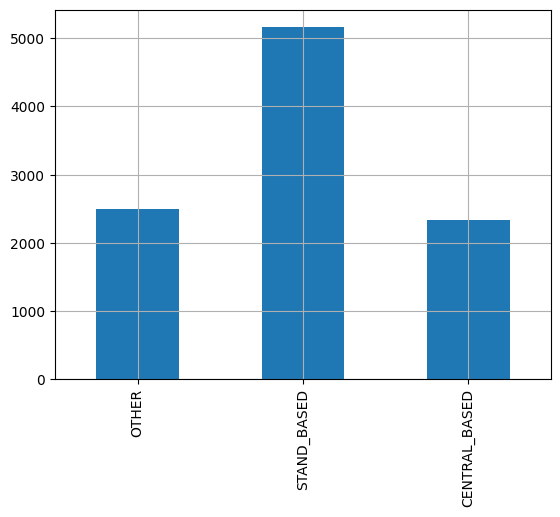

In [9]:
q1_data.plot.bar(grid=True)

Question 2 - Which regions of the city are the best pick up points?
To answer to this question we can use a dotmap.
A dotmap is a scatter plot which is put on a map to represent a geographic data distribution.
And then by looking at the different clusters of the points on the map we can get the answer.

In [10]:
Map=folium.Map(location = [41.15,-8.62],zoom_start=14)

#point=data.START_LOC.iloc[0]
#point
for point in data.START_LOC:
    folium.CircleMarker(location=point, color="red",radius=1,weight=2).add_to(Map)
Map    

### Question 3 - Which regions of the city are the best pick up points for stand-based trips?
    To answer to this question we create a dotmap with different Marker clusters, each cluster corresponds to a specific
    CALL_TYPE.

In [11]:
data.head()

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH,START_LOC,END_LOC
0,1372636858620000589,OTHER,1372636858,"[(41.141412, -8.618643), (41.141376, -8.618499...","(41.141412, -8.618643)","(41.154489, -8.630838)"
1,1372637303620000596,STAND_BASED,1372637303,"[(41.159826, -8.639847), (41.159871, -8.640351...","(41.159826, -8.639847)","(41.170671, -8.66574)"
2,1372636951620000320,OTHER,1372636951,"[(41.140359, -8.612964), (41.14035, -8.613378)...","(41.140359, -8.612964)","(41.14053, -8.61597)"
3,1372636854620000520,OTHER,1372636854,"[(41.151951, -8.574678), (41.151942, -8.574705...","(41.151951, -8.574678)","(41.142915, -8.607996)"
4,1372637091620000337,OTHER,1372637091,"[(41.18049, -8.645994), (41.180517, -8.645949)...","(41.18049, -8.645994)","(41.178087, -8.687268)"


In [12]:
q3_map=folium.Map(location=[41.15,-8.62],zoom_start=14)
colors={
    "OTHER":"purple",
    "STAND_BASED":"red",
    "CENTRAL_BASED":"blue"
}

q3_data=data[["CALL_TYPE","START_LOC"]]
for index,row in q3_data.iterrows():
    color=colors[row["CALL_TYPE"]]
    location=row["START_LOC"]
    folium.CircleMarker(location,color=color,radius=1,weight=2).add_to(q3_map)

q3_map    

Question 4 - Which regions of the city are the most common destinations on Mondays?
To answer to this question we need to use the TIMESTAMP column to extract the day each trip took place. 


In [13]:
day_names=list(calendar.day_name)

In [14]:
get_day = lambda timestamp: day_names[datetime.datetime.fromtimestamp(timestamp).weekday()]
data["week_day"]=data.TIMESTAMP.apply(get_day)
data.head

<bound method NDFrame.head of                   TRIP_ID      CALL_TYPE   TIMESTAMP  \
0     1372636858620000589          OTHER  1372636858   
1     1372637303620000596    STAND_BASED  1372637303   
2     1372636951620000320          OTHER  1372636951   
3     1372636854620000520          OTHER  1372636854   
4     1372637091620000337          OTHER  1372637091   
...                   ...            ...         ...   
9995  1372840956620000118          OTHER  1372840956   
9996  1372841563620000304          OTHER  1372841563   
9997  1372836480620000341          OTHER  1372836480   
9998  1372838570620000387          OTHER  1372838570   
9999  1372837696620000279  CENTRAL_BASED  1372837696   

                                              TRIP_PATH  \
0     [(41.141412, -8.618643), (41.141376, -8.618499...   
1     [(41.159826, -8.639847), (41.159871, -8.640351...   
2     [(41.140359, -8.612964), (41.14035, -8.613378)...   
3     [(41.151951, -8.574678), (41.151942, -8.574705...   
4 

In [15]:
q4_data=data[data.week_day == "Monday"]
q4_data.head()

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH,START_LOC,END_LOC,week_day
0,1372636858620000589,OTHER,1372636858,"[(41.141412, -8.618643), (41.141376, -8.618499...","(41.141412, -8.618643)","(41.154489, -8.630838)",Monday
1,1372637303620000596,STAND_BASED,1372637303,"[(41.159826, -8.639847), (41.159871, -8.640351...","(41.159826, -8.639847)","(41.170671, -8.66574)",Monday
2,1372636951620000320,OTHER,1372636951,"[(41.140359, -8.612964), (41.14035, -8.613378)...","(41.140359, -8.612964)","(41.14053, -8.61597)",Monday
3,1372636854620000520,OTHER,1372636854,"[(41.151951, -8.574678), (41.151942, -8.574705...","(41.151951, -8.574678)","(41.142915, -8.607996)",Monday
4,1372637091620000337,OTHER,1372637091,"[(41.18049, -8.645994), (41.180517, -8.645949)...","(41.18049, -8.645994)","(41.178087, -8.687268)",Monday


In [16]:
q4_map=folium.Map(location=[41.15,-8.62],zoom_start=14)
for loc in q4_data.END_LOC:
    folium.CircleMarker(loc,color="red",radius=1, weight=2).add_to(q4_map)
q4_map

Question 5 - What are the most common start and end points on Monday Mornings (from 6 am to 9 am)?
To answer to this question we need to extract the hour information for each of the trips. 

In [17]:
extract_hour=lambda timestamp : datetime.datetime.fromtimestamp(timestamp).hour

data["hour"]=data.TIMESTAMP.apply(extract_hour)
data.head()

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH,START_LOC,END_LOC,week_day,hour
0,1372636858620000589,OTHER,1372636858,"[(41.141412, -8.618643), (41.141376, -8.618499...","(41.141412, -8.618643)","(41.154489, -8.630838)",Monday,5
1,1372637303620000596,STAND_BASED,1372637303,"[(41.159826, -8.639847), (41.159871, -8.640351...","(41.159826, -8.639847)","(41.170671, -8.66574)",Monday,5
2,1372636951620000320,OTHER,1372636951,"[(41.140359, -8.612964), (41.14035, -8.613378)...","(41.140359, -8.612964)","(41.14053, -8.61597)",Monday,5
3,1372636854620000520,OTHER,1372636854,"[(41.151951, -8.574678), (41.151942, -8.574705...","(41.151951, -8.574678)","(41.142915, -8.607996)",Monday,5
4,1372637091620000337,OTHER,1372637091,"[(41.18049, -8.645994), (41.180517, -8.645949)...","(41.18049, -8.645994)","(41.178087, -8.687268)",Monday,5


In [18]:
q5_data=data[(data.week_day=="Monday")&(data.hour>6)&(data.hour<9)]
q5_data

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH,START_LOC,END_LOC,week_day,hour
54,1372642886620000403,STAND_BASED,1372642886,"[(41.145786, -8.610912)]","(41.145786, -8.610912)","(41.145786, -8.610912)",Monday,7
58,1372642706620000653,STAND_BASED,1372642706,"[(41.157378, -8.628327), (41.157801, -8.627994...","(41.157378, -8.628327)","(41.164209, -8.623071)",Monday,7
65,1372643618620000463,STAND_BASED,1372643618,"[(41.140764, -8.615394), (41.14143, -8.614467)...","(41.140764, -8.615394)","(41.147019, -8.620146)",Monday,7
71,1372643656620000492,OTHER,1372643656,"[(41.161221, -8.605017), (41.160807, -8.605188...","(41.161221, -8.605017)","(41.153346, -8.651862)",Monday,7
75,1372644235620000520,OTHER,1372644235,"[(41.150385, -8.611569), (41.150331, -8.61201)...","(41.150385, -8.611569)","(41.147325, -8.602524)",Monday,7
...,...,...,...,...,...,...,...,...
526,1372644810620000004,STAND_BASED,1372644810,"[(41.14602, -8.612478), (41.146065, -8.612172)...","(41.14602, -8.612478)","(41.154264, -8.649891)",Monday,7
556,1372646663620000473,STAND_BASED,1372646663,"[(41.182695, -8.600166), (41.182767, -8.600148...","(41.182695, -8.600166)","(41.232591, -8.625654)",Monday,8
645,1372648756620000481,CENTRAL_BASED,1372648756,"[(41.182353, -8.596935), (41.183586, -8.596917...","(41.182353, -8.596935)","(41.236488, -8.669835)",Monday,8
1035,1372646014620000611,OTHER,1372646014,"[(41.137722, -8.587566), (41.137578, -8.587584...","(41.137722, -8.587566)","(41.181606, -8.655903)",Monday,8
